In [1]:
from pandas import ExcelFile
import geopandas as gpd
from pandas import read_csv
from pandas import DataFrame
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from PaddockTS.Data.environmental import download_environmental_data
from PaddockTS.get_outputs import get_outputs
from PaddockTS.query import Query

2025-09-08 13:21:34.357103: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-08 13:21:35.446957: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-09-08 13:21:44.941521: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
xlsx = ExcelFile('/g/data/xe2/ya6227/NVTAnalysis/data/NVT.xlsx')
df = xlsx.parse('Canola')

In [3]:
def plot_experiments_across_australia(df: DataFrame):
    gdf = gpd.GeoDataFrame(
        df, 
        geometry=gpd.points_from_xy(
        df['Trial GPS Long'],
        df['Trial GPS Lat']),
        crs="EPSG:4326"
    )
    aus_states = gpd.read_file("/g/data/xe2/ya6227/NVTAnalysis/data/gadm41_AUS_1.shp")
    gdf_filtered = gdf.dropna(subset=["Single Site Yield", "RegionName"])

    gdf_filtered = gdf.dropna(subset=["Single Site Yield", "RegionName"])

    # Group by GPS + Region to get average yield per site
    gdf_grouped = (
        gdf_filtered.groupby(["Trial GPS Lat", "Trial GPS Long", "RegionName"])
        .agg({
            "Single Site Yield": "mean",
            "geometry": "first"
        })
        .reset_index()
    )
    
    # Convert back to GeoDataFrame
    gdf_grouped = gpd.GeoDataFrame(gdf_grouped, geometry="geometry", crs="EPSG:4326")
    
    # Normalize marker size
    min_size, max_size = 20, 200
    yield_min = gdf_grouped["Single Site Yield"].min()
    yield_max = gdf_grouped["Single Site Yield"].max()
    gdf_grouped["marker_size"] = gdf_grouped["Single Site Yield"].apply(
        lambda y: min_size + (y - yield_min) / (yield_max - yield_min) * (max_size - min_size)
    )
    
    
    unique_regions = gdf_grouped["RegionName"].unique()
    num_regions = len(unique_regions)
    colormap = cm.get_cmap("tab20", num_regions)  # You can also try "hsv" or "tab20b"
    
    # Create region → color map using hex codes
    region_colors = {
        region: mcolors.to_hex(colormap(i)) for i, region in enumerate(unique_regions)
    }
    
    # Plot
    fig, ax = plt.subplots(figsize=(16, 16))
    aus_states.plot(ax=ax, color='white', edgecolor='black')
    
    for region, group in gdf_grouped.groupby("RegionName"):
        group.plot(
            ax=ax,
            color=region_colors[region],
            markersize=group["marker_size"],
            edgecolor="black",
            alpha=0.7,
            label=region
        )
    
    ax.set_title("NVT Trial Sites by Region with Yield-based Marker Size (2017–2024)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.legend(title="Region", bbox_to_anchor=(1.05, 1), loc='upper left')
    # plt.grid(True)
    # plt.tight_layout()
    # plt.show()
        

/g/data/xe2/ya6227/tmp/ipykernel_2392378/3286352535.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap("tab20", num_regions)  # You can also try "hsv" or "tab20b"


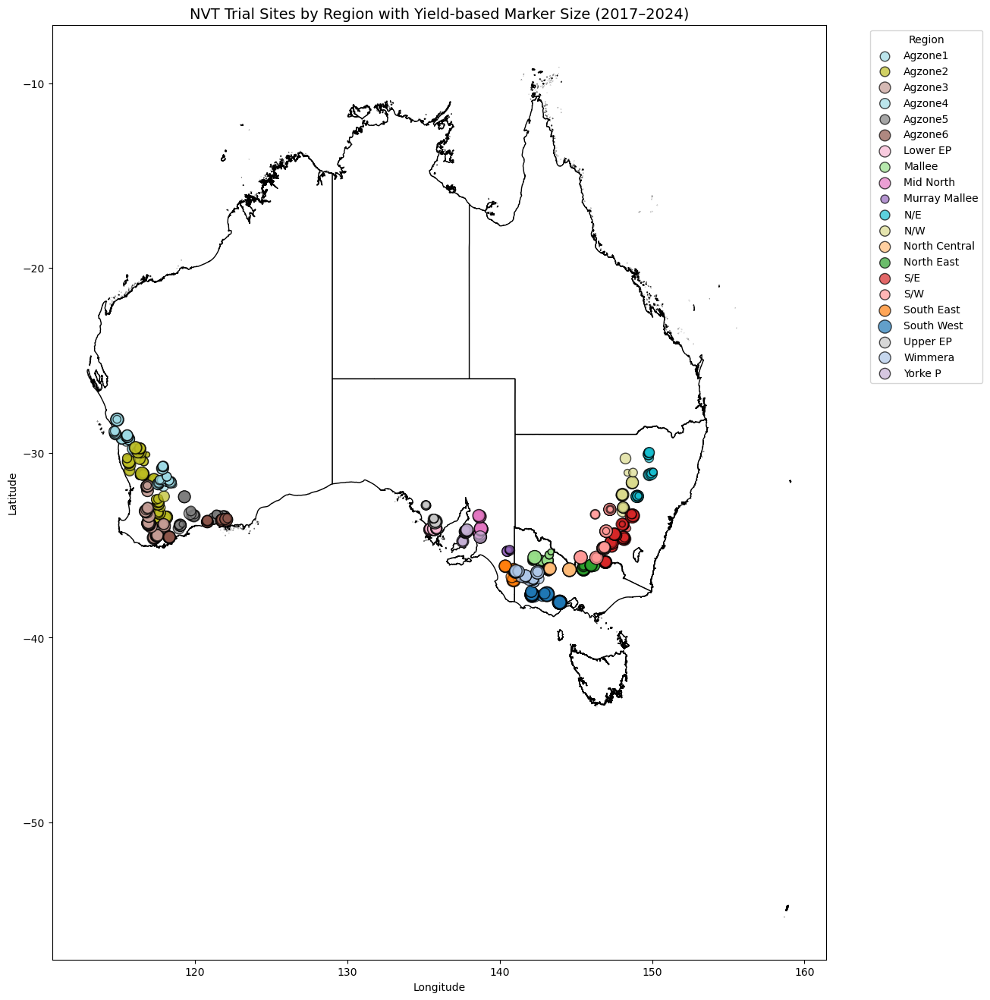

In [4]:
plot_experiments_across_australia(df)

In [5]:
def get_variety_counts(df: DataFrame):
    varieties = df['VarietyDisplayName'].unique().tolist()
    variety_counts = {}
    for variety in varieties:
        variety_counts[variety] = df[df['VarietyDisplayName'] == variety].shape[0]
    sorted_variety_counts = dict(sorted(variety_counts.items(), key=lambda item: item[1], reverse=True))
    return sorted_variety_counts

In [6]:
list(get_variety_counts(df).keys())[0]

'HyTTec Trophy'

In [7]:
df_variety = df[df['VarietyDisplayName'] == 'HyTTec Trophy']

In [8]:
df_variety

,Year,Crop.Name,State,RegionName,SiteDescription,TrialCode,SeriesName,Orientation,Company.Name,Trial GPS Lat,...,Probability,Error Mean Squared,1000 grain weight,Protein - Seed (raw),Protein Meal (10% moisture),Glucosinolate,Grain Moisture Content,Oil - Seed (6% moisture),Oil (raw),Protein Seed (10% moisture)
16,2017,Canola,NSW,N/E,Bellata,CLTA17BELL2,Low-Med Rainfall Triazine,West,NVT,-29.993147,...,0.0143951170422882,0.008355,NaN,22.8,37.790055,NaN,5.9,39.757705,39.8,21.806589
40,2017,Canola,NSW,N/E,Mullaley,CHTA17MULL2,Med-High Rainfall Triazine,West,NVT,-31.138494,...,<0.001,0.009244,NaN,25.5,44.134615,NaN,7.4,41.213823,40.6,24.784017
58,2017,Canola,NSW,N/E,Wellington,CHTA17WELL2,Med-High Rainfall Triazine,West,NVT,-32.331580,...,<0.001,0.012803,NaN,29.5,50.862069,NaN,10.3,39.297659,37.5,29.598662
76,2017,Canola,NSW,N/W,Coonamble,CLTA17COOA2,Low-Med Rainfall Triazine,South,NVT,-31.075240,...,0.00374685603827229,0.006100,NaN,23.6,41.484375,NaN,6.0,42.800000,42.8,22.595745
109,2017,Canola,NSW,N/W,Parkes,CHTA17PARK2,Med-High Rainfall Triazine,North West,NVT,-32.949630,...,<0.001,0.005918,NaN,24.6,43.242188,NaN,5.9,42.854410,42.9,23.528162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14481,2024,Canola,WA,Agzone5,Hyden,CLTA24HYDE6,Low-Med Rainfall Triazine,Unspecified,NVT,-32.378283,...,<0.001,0.011592,NaN,18.2,33.292682,NaN,5.8,44.904458,45.0,17.388535
14512,2024,Canola,WA,Agzone5,Jerramungup,CLTA24JERR6,Low-Med Rainfall Triazine,Unspecified,NVT,-33.924578,...,<0.001,0.017128,NaN,19.8,36.146044,NaN,8.6,43.297592,42.1,19.496717
14543,2024,Canola,WA,Agzone5,Mt. Madden,CLTA24MADD6,Low-Med Rainfall Triazine,Unspecified,NVT,-33.400973,...,<0.001,0.014329,NaN,19.5,34.890656,NaN,4.4,44.541841,45.3,18.357740
14580,2024,Canola,WA,Agzone6,Gibson,CHTA24GIBS6,Med-High Rainfall Triazine,Unspecified,NVT,-33.578755,...,<0.001,0.013103,NaN,23.0,40.588235,NaN,9.0,41.318681,40.0,22.747252


In [124]:
loc = 109
row = df.loc[loc]
var = 'HyTTec Trophy'

In [125]:
query = Query(
    lat=row['Trial GPS Lat'],
    lon=row['Trial GPS Long'],
    collections=['ga_s2am_ard_3', 'ga_s2bm_ard_3'],
    buffer=0.01,
    bands=[
        'nbart_blue',
        'nbart_green',
        'nbart_red',
        'nbart_red_edge_1',
        'nbart_red_edge_2',
        'nbart_red_edge_3',
        'nbart_nir_1',
        'nbart_nir_2',
        'nbart_swir_2',
        'nbart_swir_3'
    ],
    start_time=row['SowingDate'].date(),
    end_time=row['HarvestDate'].date(),
    out_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim',
    tmp_dir='/g/data/xe2/ya6227/NVTAnalysis/data/DAESim'
)

In [126]:
from PaddockTS.PaddockSegmentation.get_paddocks import get_paddocks

In [127]:
get_paddocks(query, device='cuda')

/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/e883ab5e32180aedf186409dc580d4f5086d91c16e7b53881ac79a5a909f2c48/ds2.pkl e883ab5e32180aedf186409dc580d4f5086d91c16e7b53881ac79a5a909f2c48


/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 40449 instead
  warnings.warn(


/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/e883ab5e32180aedf186409dc580d4f5086d91c16e7b53881ac79a5a909f2c48/preseg.tif ----------


KeyboardInterrupt: 

In [103]:
import geopandas as gpd
from geopandas import points_from_xy

In [104]:
polygons = gpd.read_file(query.path_polygons)

In [105]:
polygons.iloc[0]['geometry'].contains(points_from_xy([query.lat], [query.lon]))

array([False])

In [106]:
for idx, polygon in polygons.iterrows():
    print(polygon['geometry'].contains(points_from_xy([query.lon], [query.lat])))

[False]
[False]
[False]
[False]
[False]
[False]
[False]


In [107]:
from shapely.geometry import Point

In [108]:
point = Point(query.lon, query.lat)

In [109]:
polygons['geometry'].contains(point)

0    False
1    False
2    False
3    False
4    False
5    False
6    False
dtype: bool

In [110]:
polygons

,area_ha,log_area_ha,perim-area,geometry
0,86.5,1.937016,15.491329,"POLYGON ((14455970 -3655330, 14455970 -3655340..."
1,406.9,2.609488,7.274515,"POLYGON ((14454400 -3655330, 14454400 -3655340..."
2,155.0,2.190332,11.483871,"POLYGON ((14455920 -3655750, 14455920 -3655760..."
3,28.5,1.454845,25.964912,"POLYGON ((14455230 -3656390, 14455230 -3656400..."
4,214.8,2.332034,9.310987,"POLYGON ((14454270 -3656290, 14454270 -3656300..."
5,730.6,2.863680,4.900082,"POLYGON ((14454270 -3656770, 14454270 -3656780..."
6,482.7,2.683677,7.333748,"POLYGON ((14455810 -3656280, 14455810 -3656360..."


In [111]:
print(polygons.iloc[0].geometry)

POLYGON ((14455970 -3655330, 14455970 -3655340, 14455960 -3655340, 14455960 -3655410, 14455950 -3655410, 14455950 -3655480, 14455940 -3655480, 14455940 -3655580, 14455930 -3655580, 14455930 -3655630, 14455920 -3655630, 14455920 -3655680, 14455910 -3655680, 14455910 -3655720, 14455920 -3655720, 14455920 -3655730, 14456020 -3655730, 14456020 -3655740, 14456080 -3655740, 14456080 -3655750, 14456140 -3655750, 14456140 -3655760, 14456150 -3655760, 14456150 -3655340, 14456140 -3655340, 14456140 -3655330, 14455970 -3655330))


In [112]:
print(point)

POINT (149.81617 -29.97867)


In [113]:
polygons.geometry.to_crs('EPSG:4326')

0    POLYGON ((149.8241 -29.9688, 149.8241 -29.9688...
1    POLYGON ((149.80783 -29.9688, 149.80783 -29.96...
2    POLYGON ((149.82358 -29.97259, 149.82358 -29.9...
3    POLYGON ((149.81643 -29.97836, 149.81643 -29.9...
4    POLYGON ((149.80648 -29.97746, 149.80648 -29.9...
5    POLYGON ((149.80648 -29.98179, 149.80648 -29.9...
6    POLYGON ((149.82244 -29.97737, 149.82244 -29.9...
Name: geometry, dtype: geometry

In [114]:
print(point)

POINT (149.81617 -29.97867)


In [115]:
polygons.geometry.to_crs('EPSG:4326').covers(point_gs)

/g/data/xe2/ya6227/tmp/ipykernel_2392378/815116396.py:1: UserWarning: The indices of the left and right GeoSeries' are not equal, and therefore they will be aligned (reordering and/or introducing missing values) before executing the operation. If this alignment is the desired behaviour, you can silence this warning by passing 'align=True'. If you don't want alignment and protect yourself of accidentally aligning, you can pass 'align=False'.
  polygons.geometry.to_crs('EPSG:4326').covers(point_gs)


0    False
1    False
2    False
3    False
4    False
5    False
6    False
dtype: bool

In [116]:
point_gs = gpd.GeoSeries([point], crs="EPSG:4326") 

In [117]:
inside = polygons.geometry.iloc[4].covers(point_gs.iloc[0])
inside

False

EPSG:6933


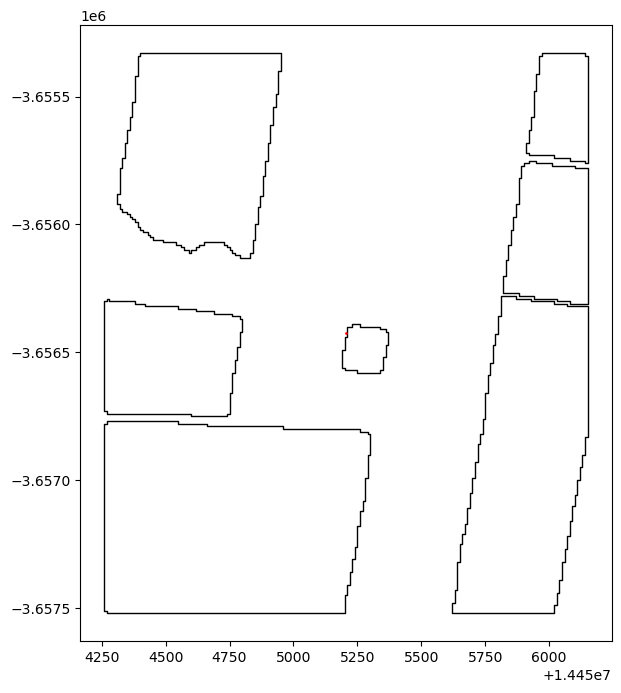

In [118]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Example: polygons already have CRS (e.g., EPSG:3857)
print(polygons.crs)

# Create GeoSeries for your query point (assume it's lon/lat WGS84)
pt = gpd.GeoSeries([Point(query.lon, query.lat)], crs="EPSG:4326")

# Reproject point to match polygons
pt = pt.to_crs(polygons.crs)

# Plot polygons and point
ax = polygons.plot(edgecolor="black", facecolor="none", figsize=(8, 8))
pt.plot(ax=ax, color="red", markersize=1)

plt.show()

In [119]:
query.path_polygons

'/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8/polygons.gpkg'

In [91]:
point_gs.to_file('/home/272/ya6227/chris_point.gpkg')

INFO:pyogrio._io:Created 1 records


In [90]:
pwd

'/home/272/ya6227'

In [120]:
from PaddockTS.PaddockTS.get_paddock_ts import get_paddock_ts

In [121]:
get_paddock_ts(query)

In [94]:
from PaddockTS.Plotting.checkpoint_plots import plot

/g/data/xe2/ya6227/NVTAnalysis/data/DAESim/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8/DS2I.pkl
Exporting image to /g/data/xe2/ya6227/NVTAnalysis/data/DAESim/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8/checkpoints/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8_thumbs_rgb.png
Exporting image to /g/data/xe2/ya6227/NVTAnalysis/data/DAESim/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8/checkpoints/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8_thumbs_vegfrac.png


INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.0 x 6.932642487046633 to 6.0 x 6.92
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x692 -pix_fmt rgba -framerate 10 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /g/data/xe2/ya6227/NVTAnalysis/data/DAESim/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8/checkpoints/0e83c177265dba669febd2e389a6309a0bcd2b108b2c4170b0ace56af76cb0e8_manpad_RGB.mp4
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.FFMpegWriter'>
INFO:matplotlib.animation:figure size in inches has been adjusted from 6.0 x 6.932642487046633 to 6.0 x 6.92
INFO:matplotlib.animation:MovieWriter._run: running command: ffmpeg -f rawvideo -vcodec rawvideo -s 600x692 -pix_fmt rgba -framerate 10 -loglevel error -i pipe: -vcodec h264 -pix_fmt yuv420p -y /g/data/xe2/

Normalizing all frames by reference max = 0.948


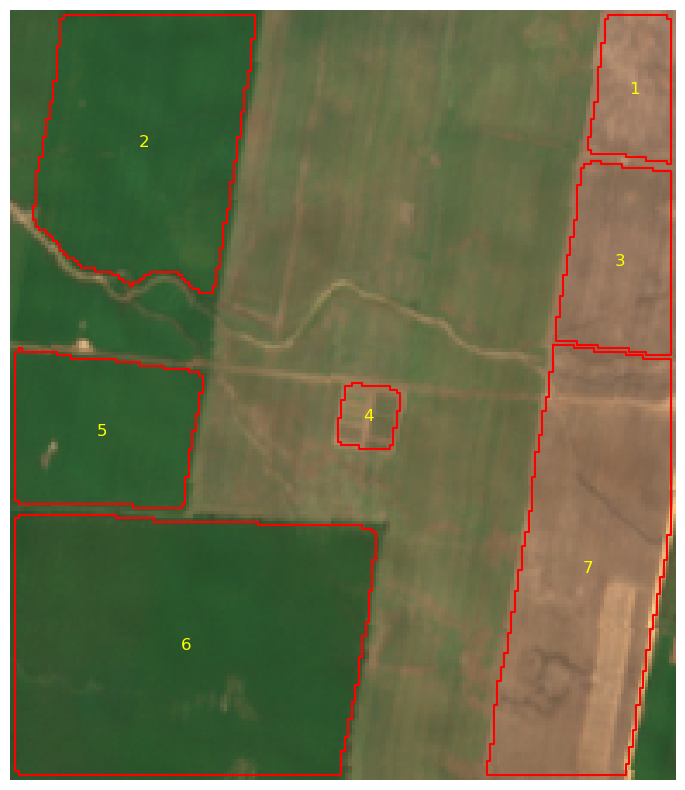

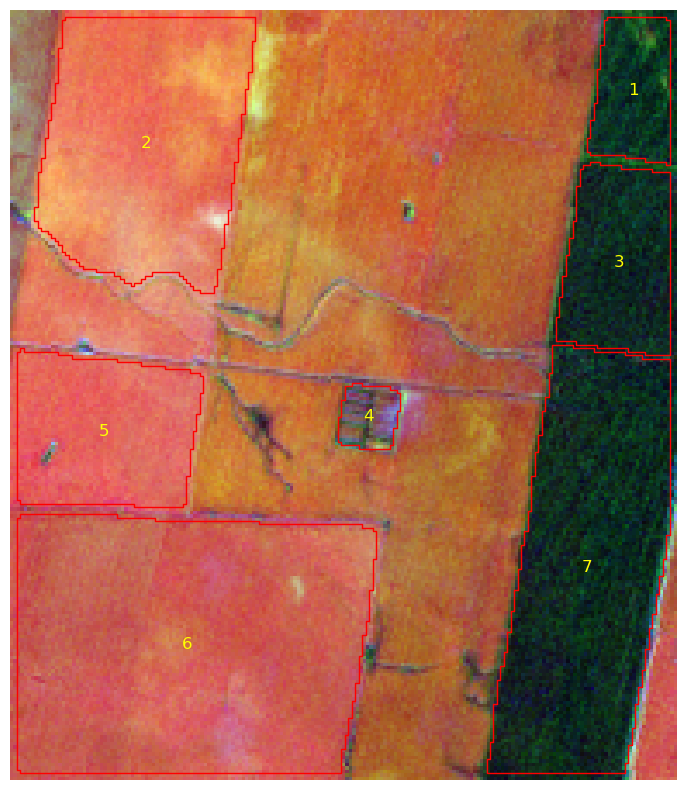

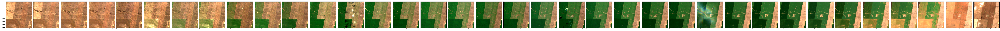

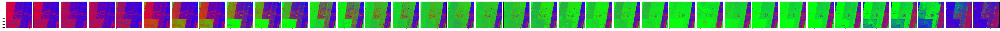

In [123]:
plot(query)

In [96]:
from PaddockTS.IndicesAndVegFrac.add_indices_and_veg_frac import add_indices_and_veg_frac

In [122]:
add_indices_and_veg_frac(query)

SHape of input (should be time, bands, x, y): (36, 6, 223, 193)
Not applying correction factors


/g/data/xe2/ya6227/miniconda3/envs/PaddockTSEnv/lib/python3.10/site-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


NDVI has shape: (36, 223, 193)
CFI has shape: (36, 223, 193)
NIRv has shape: (36, 223, 193)
